In [1]:
import torch
from utils import *
from fastseg import MobileV3Small, MobileV3Large
import matplotlib.pyplot as plt
from dataloader import UROBDataset

%load_ext autoreload
%autoreload 2

In [2]:
device = 'cuda:0'
if not torch.cuda.is_available():
    device = 'cpu'

print(device)

cuda:0


In [6]:
src_filenames = './experiments/other_cars_test/train_filenames.pkl'
model_path = './experiments/other_cars_test/model.pt'

# get the dataset
label_mapping = {
    2 : 1, # car,
    3: 1,
    7: 1,
    40:2
}
unique_labels = [0, 1, 2]
dataset = UROBDataset(filenames_file=src_filenames, target_img_shape=[512, 1024], label_mapping=label_mapping)
loader = torch.utils.data.DataLoader(dataset)

In [4]:
# load the model
model = MobileV3Large(num_classes=len(unique_labels))
model.load_state_dict(torch.load(model_path))
model = model.to(device)

# dummy loss function
def criterion(x, y):
    return torch.tensor([0])

 ------- VALIDATING ------- 


/home/koondra/temp_school/UROB/hws/hw03/UROB_segmentation/utils.py:87: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/TensorAdvancedIndexing.cpp:1772.)
  img_vis[0, np.logical_and(vis_labels == 1, true_abels != 10)] = 1
/home/koondra/temp_school/UROB/hws/hw03/UROB_segmentation/utils.py:88: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/TensorAdvancedIndexing.cpp:1772.)
  img_vis[2, np.logical_and(vis_labels == 2, true_abels != 10)] = 1


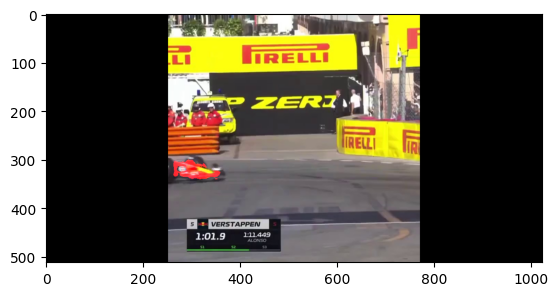

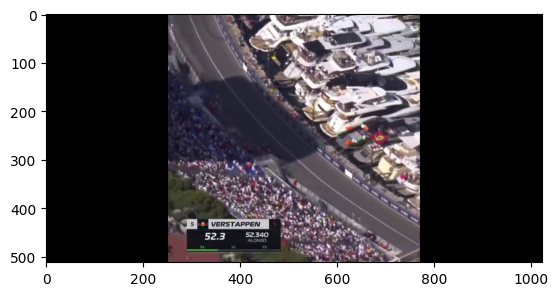

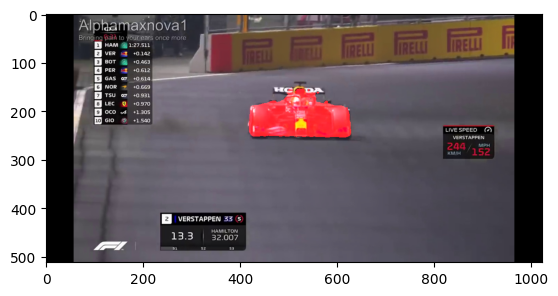

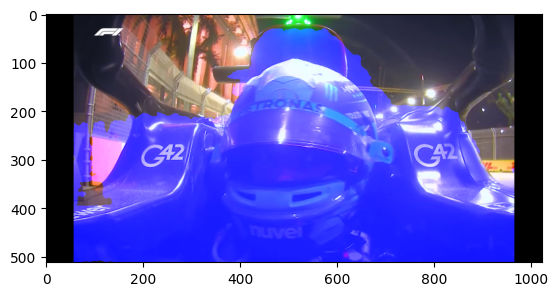

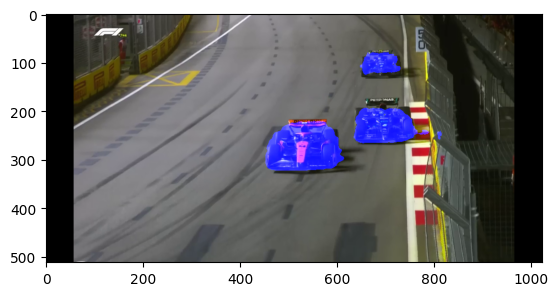

...

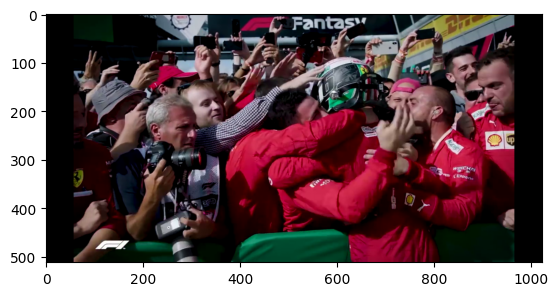

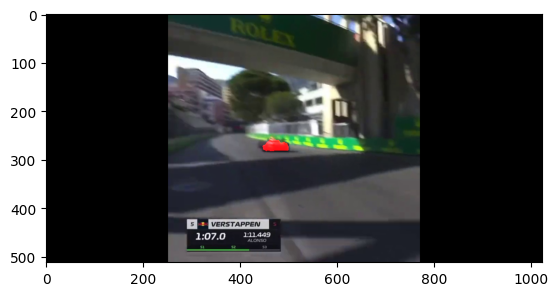

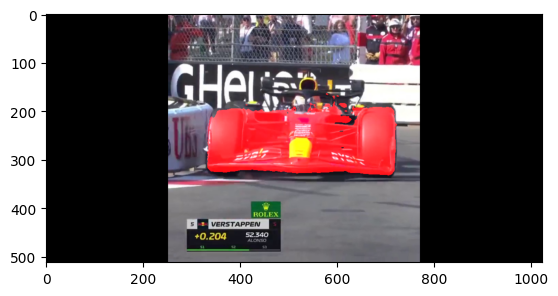

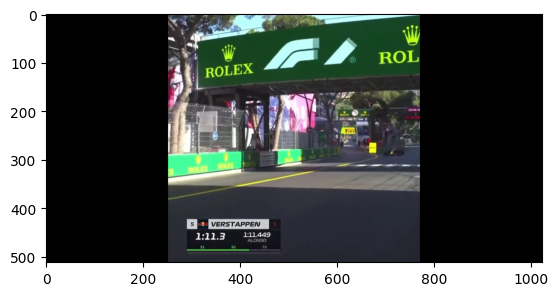

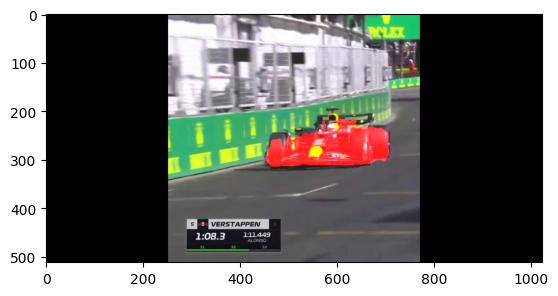

In [7]:
loss_hist, cls_tp_hist, cls_tn_hist, cls_fp_hist, cls_fn_hist = validate(
        val_dataloader=loader,
        model=model,
        criterion=criterion,
        unique_labels = unique_labels,
        device=device,
        visualize=True
        #save_path='./experiments/init_test/val_vis/'
    )